### ✨ **Author Information** 

|                    |                                                                 |
|--------------------|-----------------------------------------------------------------|
| **Author**         | Neelam Patidar                                                  |
| **Date**           | May 13, 2025                                                 |
| **Supervisor**     | Dr. Jongwook Woo                                              |
| **Affiliation**    | Big Data AI Center (BigDAI): High Performance Information Computing Center (HiPIC) |

---

### 📘 About the Project

This project presents an advanced data-driven analysis of 1.3 M job postings collected from LinkedIn in 2024, with a special focus on U.S.-based **tech job trends**. The analysis aims to uncover actionable insights for job seekers, hiring managers, and academic researchers by applying **Big Data tools**, **unsupervised machine learning**, and **content-based recommendation algorithms**.

Dataset URL- https://www.kaggle.com/datasets/asaniczka/1-3m-linkedin-jobs-and-skills-2024

#### 🔍 Objectives:
- Identify **geographic and industry-level trends** in tech hiring.
- Analyze **in-demand job titles, job levels, and company-wise hiring activity**.
- Uncover **latent skill clusters** using **LDA (Latent Dirichlet Allocation)** to group job roles based on required competencies.
- Design a **job recommendation system** using **TF-IDF vectorization and cosine similarity**, tailored to user preferences.

#### 🛠 Technologies & Techniques Used:
- **Apache Spark (PySpark)** for distributed data processing.
- **Spark MLlib** for text preprocessing, feature extraction, and topic modeling.
- **Latent Dirichlet Allocation (LDA)** to uncover dominant job skill clusters.
- **TF-IDF** for textual vectorization of job postings.
- **Content-Based Filtering Recommendation Model(Unsupervised Learning)** to suggest jobs based on user-input preferences.
- **Matplotlib & Seaborn** for data visualization.

#### Key Outcomes:
- Identified top job locations (cities, states), job types (onsite, remote, hybrid), and job levels (entry, mid-senior).
- Standardized and grouped thousands of job titles using NLP-based rules and regular expressions.
- Clustered jobs into **8 interpretable skill-based topics** (e.g., Data Science, Cloud DevOps, ERP Systems).
- Developed a **custom job recommendation system** based on semantic similarity to user input.

This pipeline demonstrates how **Big Data tools can power intelligent career insights** and guide both individuals and organizations in navigating the evolving tech job market.


### Importing Required Libraries

This cell imports all necessary packages used throughout the project:

- **Spark SQL & DataFrame Utilities**: For managing Spark sessions and performing operations on DataFrames and columns (`SparkSession`, `col`, `count`, `regexp_replace`, etc.).
- **PySpark ML Features and Models**: Includes tools for text processing (`Tokenizer`, `StopWordsRemover`, `CountVectorizer`, `HashingTF`, `IDF`) and clustering (`LDA`).
- **Python Utility Libraries**: Helpful Python libraries like `numpy`, `pandas`, `re`, `operator`, and `functools` to assist in general-purpose operations and transformations.
- **Visualization Libraries**: `matplotlib.pyplot` and `seaborn` are imported to create insightful visualizations from the processed data.

These imports form the foundational setup required for big data processing, machine learning, and visualization tasks in PySpark.


In [0]:
# Spark SQL and DataFrame utilities
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, lower, count, when, isnan, desc, split, trim, regexp_replace, udf, create_map, lit, concat_ws
from pyspark.sql.types import StringType, IntegerType, DoubleType

# PySpark ML features and models
from pyspark.ml.feature import StopWordsRemover, CountVectorizer, Tokenizer, HashingTF, IDF
from pyspark.ml.clustering import LDA

# Python utility libraries
import numpy as np
import pandas as pd
import re
import operator
from functools import reduce

# Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns


###A. DATA INGESTION AND EXPLORATION

#### Initialize Spark Session & Load Dataset

- Initialize the **Spark Session** for distributed data processing.
- Define the **file path** and **format options** for loading the LinkedIn job postings dataset (CSV format).
- Use `spark.read.format("csv")` to read the file with appropriate options:
  - `inferSchema=True` to automatically detect column data types.
  - `header=True` to treat the first row as column names.
  - `sep=","` for comma-separated values.


In [0]:
# Initialize Spark session
spark = SparkSession.builder \
    .appName("Linked Job Review 2024") \
    .getOrCreate()

# File location and type for linkedin_job_postings
linkedin_job_postings_path = "/FileStore/tables/linkedin_job_postings.csv"
file_type = "csv"

# CSV options
infer_schema = "True"
first_row_is_header = "True"
delimiter = ","

#Load job posting file
linkedin_job_postings_df = spark.read.format("csv") \
    .option("inferSchema", "true") \
    .option("header", "true") \
    .option("sep", ",") \
    .load(linkedin_job_postings_path)

display(linkedin_job_postings_df.limit(10))

job_link,last_processed_time,got_summary,got_ner,is_being_worked,job_title,company,job_location,first_seen,search_city,search_country,search_position,job_level,job_type
https://www.linkedin.com/jobs/view/account-executive-dispensing-norcal-northern-nevada-becton-dickinson-at-bd-3802078767,2024-01-21 07:12:29.00256+00,t,t,f,Account Executive - Dispensing (NorCal/Northern Nevada) - Becton Dickinson,BD,"San Diego, CA",2024-01-15,Coronado,United States,Color Maker,Mid senior,Onsite
https://www.linkedin.com/jobs/view/registered-nurse-rn-care-manager-at-trinity-health-mi-3803386312,2024-01-21 07:39:58.88137+00,t,t,f,Registered Nurse - RN Care Manager,Trinity Health MI,"Norton Shores, MI",2024-01-14,Grand Haven,United States,Director Nursing Service,Mid senior,Onsite
https://www.linkedin.com/jobs/view/restaurant-supervisor-the-forklift-at-wasatch-adaptive-sports-3771464419,2024-01-21 07:40:00.251126+00,t,t,f,RESTAURANT SUPERVISOR - THE FORKLIFT,Wasatch Adaptive Sports,"Sandy, UT",2024-01-14,Tooele,United States,Stand-In,Mid senior,Onsite
https://www.linkedin.com/jobs/view/independent-real-estate-agent-at-howard-hanna-rand-realty-3797661348,2024-01-21 07:40:00.308133+00,t,t,f,Independent Real Estate Agent,Howard Hanna | Rand Realty,"Englewood Cliffs, NJ",2024-01-16,Pinehurst,United States,Real-Estate Clerk,Mid senior,Onsite
https://www.linkedin.com/jobs/view/group-unit-supervisor-systems-support-manager-tss-at-irs-office-of-chief-counsel-3803057508,2024-01-19 09:45:09.215838+00,f,f,f,Group/Unit Supervisor (Systems Support Manager TSS),"IRS, Office of Chief Counsel","Chamblee, GA",2024-01-17,Gadsden,United States,Supervisor Travel-Information Center,Mid senior,Onsite
https://www.linkedin.com/jobs/view/counselor-07532802-at-icl-3765316747,2024-01-19 09:45:09.215838+00,f,f,f,Counselor-07532802,ICL,"Brooklyn, NY",2024-01-16,Oyster Bay,United States,Residence Counselor,Mid senior,Onsite
https://www.linkedin.com/jobs/view/registered-nurse-rn-at-trinity-health-mi-3790954711,2024-01-21 08:08:19.663033+00,t,t,f,Registered Nurse (RN),Trinity Health MI,"Muskegon, MI",2024-01-14,Muskegon,United States,Nurse Practitioner,Mid senior,Onsite
https://www.linkedin.com/jobs/view/part-time-hr-generalist-at-creative-financial-staffing-cfs-3798316459,2024-01-21 08:08:19.912883+00,t,t,f,Part Time- HR Generalist,Creative Financial Staffing (CFS),"New York, NY",2024-01-16,White Plains,United States,Human Resource Advisor,Mid senior,Onsite
https://uk.linkedin.com/jobs/view/store-manager-at-b-m-retail-3800482794,2024-01-21 08:08:20.658147+00,t,t,f,Store Manager,B&M Retail,"London, England, United Kingdom",2024-01-15,Slough,United Kingdom,Double,Mid senior,Onsite
https://ca.linkedin.com/jobs/view/engineering-project-coordinator-at-shared-health-soins-communs-3767503688,2024-01-21 08:08:20.998834+00,t,t,f,Engineering Project Coordinator,Shared Health-Soins Communs,"Winnipeg, Manitoba, Canada",2024-01-14,Manitoba,Canada,Program Coordinator,Mid senior,Onsite


#### Inspect Dataset Schema & Dimensions
- Use `.printSchema()` to display the structure of the DataFrame
- Count the **total number of rows** and determine the **total number of columns** 

In [0]:
#Print Schema
linkedin_job_postings_df.printSchema()

print("Total Rows:", linkedin_job_postings_df.count())
print("Total Columns:", len(linkedin_job_postings_df.columns))

root
 |-- job_link: string (nullable = true)
 |-- last_processed_time: string (nullable = true)
 |-- got_summary: string (nullable = true)
 |-- got_ner: string (nullable = true)
 |-- is_being_worked: string (nullable = true)
 |-- job_title: string (nullable = true)
 |-- company: string (nullable = true)
 |-- job_location: string (nullable = true)
 |-- first_seen: string (nullable = true)
 |-- search_city: string (nullable = true)
 |-- search_country: string (nullable = true)
 |-- search_position: string (nullable = true)
 |-- job_level: string (nullable = true)
 |-- job_type: string (nullable = true)

Total Rows: 1348488
Total Columns: 14


####![](path) Load other data file `jobs_skills`

In [0]:
# File location and type job_skills
job_skills_path = "/FileStore/tables/job_skills.csv"
file_type = "csv"

job_skills_df = spark.read.option("header", "true") \
                          .option("multiLine", "true") \
                          .option("delimiter", ",") \
                          .option("quote", "\"") \
                          .option("escape", "\"") \
                          .option("mode", "PERMISSIVE") \
                          .csv(job_skills_path)

#Print Schema
job_skills_df.printSchema()

print("Total Rows:", job_skills_df.count())
print("Total Columns:", len(job_skills_df.columns))

#Display job skills table
display(job_skills_df.limit(10))


root
 |-- job_link: string (nullable = true)
 |-- job_skills: string (nullable = true)

Total Rows: 1296381
Total Columns: 2


job_link,job_skills
https://www.linkedin.com/jobs/view/housekeeper-i-pt-at-jacksonville-state-university-3802280436,"Building Custodial Services, Cleaning, Janitorial Services, Materials Handling, Housekeeping, Sanitation, Waste Management, Floor Maintenance, Equipment Maintenance, Safety Protocols, Communication Skills, Attention to Detail, Physical Strength, Experience in Housekeeping"
https://www.linkedin.com/jobs/view/assistant-general-manager-huntington-4131-at-ruby-tuesday-3575032747,"Customer service, Restaurant management, Food safety, Training, Supervision, Scheduling, Inventory, Cost control, Sales, Communication, Problemsolving, Leadership, Motivation, Teamwork, High School Diploma, Bachelor's Degree, ServSafe Certification, Valid Driver's License, Physical ability to perform job duties"
https://www.linkedin.com/jobs/view/school-based-behavior-analyst-at-ccres-educational-and-behavioral-health-services-3739544400,"Applied Behavior Analysis (ABA), Data analysis, Behavioral assessment, Positive behavior support, Programming development, Progress monitoring, Staff training, Verbal communication, Written communication, Team collaboration, Autism, Emotional/behavioral disorders, Intellectual disabilities, BCBA certification, Masters degree, Professional liability insurance, Clearances (Act 151 Act 34 FBI Use code: 1KG6XN), TB screening, Independent contractor, 1099"
https://www.linkedin.com/jobs/view/electrical-deputy-engineering-group-supervisor-at-energy-jobline-3773709557,"Electrical Engineering, Project Controls, Scheduling, Estimating, Engineering Efforts, Planning, Work Packaging, Communication Skills, Verbal Communication, Written Communication, Engineering Tools, Office Automation Tools, Industry Guides, Regulatory Guides, Codes, Standards, Electrical Engineering Design Principles, Electrical Systems, Schematics, Layouts, Engineering Drawings, Systems Calculations, Equipment Sizing, Cable Sizing, Power Systems Load Modeling, Power Systems Analysis, Revit, ETAP, Equipment Configuration Packages, Mechanical Engineering, Process Engineering, CSI Masterformat Specifications, SpecsIntact, Unified Facilities Criteria, Whole Building Design Guide"
https://www.linkedin.com/jobs/view/electrical-assembly-lead-at-sanmina-3704300377,"Electrical Assembly, Point to point wiring, Stripping and crimping of wiring, Reading blueprints and SOPs, Leadership skills, Communication skills, Directing and training employees, Problem solving, Excellent attendance, 46 years of related experience, High School or GED"
https://www.linkedin.com/jobs/view/senior-lead-technician-programmer-at-security-101-3785441848,"Access Control, Video Management Systems, IPbased video systems, Intrusion Alarm Systems, SQL, Databases, Genetec, Software House, Avigilon Unity, Avigilon Alta, Brivo, Milestone, SIP IP Phone Systems, Quality Control, Customer Service, Project Progress Tracking, Electronics Training, Technical School, Military Training"
https://www.linkedin.com/jobs/view/program-consultant-at-methodist-family-health-3588621456,"Consultation, Supervision, InService Training, PreService Training, Youth Intake, Individual Treatment Plans, Program Development, Data Collection, Quality Control Programs, Performance Evaluations, Staff Recruitment and Selection, Emergency Consultation, Quality Improvement, Joint Commission Standards, TFM Certification, SelfMotivation, High Stress Tolerance, Fast Paced Work Environment, Minimal Supervision, Auditory Ability, Visual Ability, Olfactory Ability, Physical Stamina, Computer Literacy, Communication Skills, Reading and Writing Skills, Clinical Duties, COVID19 Vaccination, Flu Shot"
https://www.linkedin.com/jobs/view/veterinary-receptionist-at-wellhaven-pet-health-3803807922,"Veterinary Receptionist, AAHAaccredited, Customer service, Communication skills, Organizational skills, Problemsolving skills, Time management skills, Ability to work independently, Ability to multitask, Ability to work in a fastpaced environ

### B. DATA CLEANING AND PRE-PROCESSING

#### Merge `linkedin_job_postings_df` with `jobs_skills_df`

In [0]:
# Merge linkedin_job_postings_df with job_skills_df based on job_link
linkedin_job_postings_df = linkedin_job_postings_df.join(job_skills_df, on="job_link", how="inner")

# Display a few rows to confirm merge
display(linkedin_job_postings_df.limit(5))

print("Total Rows:", linkedin_job_postings_df.count())
print("Total Columns:", len(linkedin_job_postings_df.columns))

job_link,last_processed_time,got_summary,got_ner,is_being_worked,job_title,company,job_location,first_seen,search_city,search_country,search_position,job_level,job_type,job_skills
https://ae.linkedin.com/jobs/view/evs-operator-at-sundus-recruitment-and-outsourcing-services-abu-dhabi-3772971736,2024-01-21 07:21:39.439697+00,t,t,f,EVS Operator,Sundus,"Abu Dhabi, Abu Dhabi Emirate, United Arab Emirates",2024-01-17,Saint Joseph,United States,Unit Operator,Mid senior,Onsite,"EVS, EVS Operator, Production, Highlight Packages, EVS IP Director, Communication, Teamwork, Interpersonal Skills, Pressure Handling, Deadlines"
https://ae.linkedin.com/jobs/view/operations-supervisor-at-skydive-dubai-3796356710,2024-01-21 14:09:43.121041+00,t,t,f,Operations Supervisor,Skydive Dubai,"Dubai, United Arab Emirates",2024-01-17,Gloucester,United States,Supervisor Rides,Associate,Onsite,"Operations management, Leadership, Communication, Safety regulations, Customer service, Event management, Scheduling, Inspection, Maintenance, Microsoft Office Suite, Social Media"
https://ae.linkedin.com/jobs/view/production-assistant-at-sundus-recruitment-and-outsourcing-services-abu-dhabi-3710621310,2024-01-19 17:30:54.77378+00,t,t,f,Production Assistant,Sundus,United Arab Emirates,2024-01-16,North Dakota,United States,Grading Clerk,Associate,Onsite,"Monitoring, Grading, Sorting, Picking, Packaging, Dispatching, Machine operation"
https://ae.linkedin.com/jobs/view/project-operations-engineer-at-taqeef-3803932295,2024-01-21 03:25:11.654682+00,t,t,f,Project Operations Engineer,Taqeef,"Dubai, United Arab Emirates",2024-01-14,San Jose,United States,Standards Engineer,Associate,Onsite,"Project Management, Mechanical Engineering, HVAC, MEP, Site Supervision, Project Commissioning, Inspection, Quality Control, AutoCAD, Design, Construction, Building, Energy Efficiency, Cost Estimation, Communication, ProblemSolving, Microsoft Office Suite, Technical Writing, Data Analysis, Teamwork, Health and Safety Procedures, PPE, Project Operations, Project Documentation, Subcontractor Management, Progress Reporting, VRF, Chillers, Duct, Packaged Products"
https://au.linkedin.com/jobs/view/%09associate-nurse-unit-manager-custodial-fymhs-at-the-royal-melbourne-hospital-3803879583,2024-01-19 09:45:09.215838+00,t,t,f,Associate Nurse Unit Manager - Custodial FYMHS,The Royal Melbourne Hospital,"Little River, Victoria, Australia",2024-01-13,Victoria,Australia,Electronics Worker,Mid senior,Onsite,"Mental health nursing, Risk assessment, Mental state assessment, Psychoeducation, Care coordination, Youth mental health, Clinical practice, Staff supervision, Clinical review, Training, Professional development, Youth justice system, Criminal justice system, Multidisciplinary team, Group and individual psychosocial recoverybased care, Clinical standards, Workforce management, Evidencebased nursing care, Clinical environment"


Total Rows: 1296381
Total Columns: 15


####  Filter Tech-Related Job Postings

This step filters the main job postings dataset to isolate **technology-related roles** by:

- Defining a list of relevant **keywords** such as `"data"`, `"machine learning"`, `"AI"`, `"software"`, etc.
- Using a list comprehension with `lower(col("job_title")).like(...)` to create a dynamic **OR condition** for all keywords.
- Applying this filter to the original dataset to produce `linkedin_tech_df`, which only contains tech-related job titles.


In [0]:
# Keywords for filtering tech-related roles
tech_keywords = [
    "data", "machine learning", "ML", "AI", "artificial intelligence",
    "software", "cloud", "deep learning",
    "business analyst", "business intelligence"
]

#kw is the loop variable in the list comprehension.
#It takes each value from tech_keywords one by one and builds a filter condition using it.

# Build OR condition across all keywords
tech_filter_condition = reduce(
    operator.or_,
    [lower(col("job_title")).like(f"%{kw}%") for kw in tech_keywords]
)


# Apply filter to get only tech jobs
linkedin_tech_df = linkedin_job_postings_df.filter(tech_filter_condition)


#Display top 20 rows for the Tech jobs
display(linkedin_tech_df.limit(20))


job_link,last_processed_time,got_summary,got_ner,is_being_worked,job_title,company,job_location,first_seen,search_city,search_country,search_position,job_level,job_type,job_skills
https://www.linkedin.com/jobs/view/data-domain-architect-lead-workforce-planning-at-clickjobs-io-3800724481,2024-01-19 09:45:09.215838+00,t,t,f,"Data Domain Architect Lead, Workforce Planning",ClickJobs.io,"Townsend, DE",2024-01-12,Bridgeton,United States,Architect,Mid senior,Onsite,"Data Analytics, Report Automation, Visualization, Data Mining, Data Analysis, Tableau, SQL, Alteryx, Extract Transform Load (ETL), Critical Thinking, Problem Solving, Structured Query Language (SQL), Data Management, Data Governance, Big Data Platforms, Data Architecture, AWS, Snowflake, Microsoft Office (Excel PowerPoint), Python, PySpark, Power Business Intelligence (BI), Illustrator, Adobe Analytics, Research, Agile, Scrum, Bachelor’s Degree, Computer Science, Statistics, Engineering, Mathematics, Information Science, Verbal Communication, Written Communication, Analytical Skills, Large Scale Data Handling, Cloud Amazon Web Services (AWS / Azure)"
https://www.linkedin.com/jobs/view/software-engineer-at-community-behavioral-health-3799957973,2024-01-19 09:45:09.215838+00,t,t,f,Software Engineer,Community Behavioral Health,"Philadelphia, PA",2024-01-12,Winslow,United States,Agricultural-Research Engineer,Associate,Onsite,"SQL, Python, Django, HTML, CSS, JavaScript, Bootstrap, Microsoft Visual C# .net, Microsoft Visual Basic .net, VBScript, ETL, SSIS, DTS, Azure DevOps, Production Support, Healthcare, Teamwork, Collaboration, Respect, Member Centric, Honesty, Integrity, Commitment to Service Excellence, Compassion, Empathy, Problem Solving, Initiative, SelfDirected, Flexibility, Adaptability, Communication, Strategic Thinking, Leadership, Employee Development, Microsoft SQL Server 20002017, Pandas, XlsxWriter, Xlrd, Openpyxl, Pyodbc, SQLAlchemy, Internet Information Services (IIS)"
https://www.linkedin.com/jobs/view/staff-software-engineer-data-frameworks-at-ridgeline-3675316377,2024-01-19 09:45:09.215838+00,t,t,f,"Staff Software Engineer, Data Frameworks",Ridgeline,"Reno, NV",2024-01-12,Sparks,United States,Agricultural-Research Engineer,Mid senior,Onsite,"Data engineering, Software development lifecycle, AWS, Python, Java, Data structure, Algorithms, Architectural patterns, Relational databases, Backend infrastructure, React, Redux, Agile development, Design, Economics, Business, Problemsolving, Communication, Collaboration, Unit testing, Integration testing, Component testing, Workflows"
https://www.linkedin.com/jobs/view/senior-cloud-devsecops-engineer-at-applied-insight-llc-3762868844,2024-01-19 09:45:09.215838+00,t,t,f,Senior Cloud DevSecOps Engineer,"Applied Insight, LLC","Colorado Springs, CO",2024-01-12,Cripple Creek,United States,Architect,Mid senior,Onsite,"AWS, Azure, GCP, Terraform, Packer, Salt, Ansible, Python, Powershell, Bash, Javascript, Go, Helm, ArgoCD, Istio, Prometheus, SSO, MFA, SAML, iDP, RBAC, VDI, AWS Workspaces, Azure Windows Virtual Desktop, EFK Stacks, ElasticSearch, Fluentd, Kibana, Linux, Docker, Kubernetes, JSON, YAML, Infrastructure as Code, TCP/IP, Layer 3 Routing, BGP, Firewall Security, Cloud Experience, Linux configuration management, system administration, troubleshooting, CI/CD pipelines, Gitlab, Jenkins, Agile development methodologies, Zero Trust Architectures, CloudNative Architectures"
https://www.linkedin.com/jobs/view/senior-software-engineer-protocol-at-recruiting-from-scratch-3744392587,2024-01-19 09:45:09.215838+00,t,t,f,"Senior Software Engineer, Protocol",Recruiting from Scratch,"South Venice, FL",2024-01-12,Sarasota,United States,Agricultural-Research Engineer,Mid senior,Onsite,"Decentralized systems, Blockchain, Distributed key management, Multichain observer infrastructure, IBC protocol, Large scale simulation testing, Documentation, Ownership of various components, IBC toolchain roadmap, Sustainable growth, Scaling ad

####Data Cleaning: Null and Duplicate Detection

This cell perform essential **data cleaning** tasks on the filtered tech job postings dataset:

- **Null Check**: to count the number of nulls or NaNs in each column of the DataFrame.
- **Duplicate Check**: Used the `job_link` column as a unique identifier.

In [0]:
# Function to check nulls (including NaNs)
def check_nulls(df):
    return df.select([count(when(col(c).isNull() | isnan(c), c)).alias(c) for c in df.columns])

# Check for nulls in the tech jobs dataset
check_nulls(linkedin_tech_df).show()

# Count total rows
total_rows = linkedin_tech_df.count()

# Count distinct rows based on job_link (to detect duplicates)
distinct_rows = linkedin_tech_df.select("job_link").distinct().count()

# Print number of duplicates
print(f"Total Rows: {total_rows}")
print(f"Distinct job_link values: {distinct_rows}")
print(f"Duplicate Rows: {total_rows - distinct_rows}")


+--------+-------------------+-----------+-------+---------------+---------+-------+------------+----------+-----------+--------------+---------------+---------+--------+----------+
|job_link|last_processed_time|got_summary|got_ner|is_being_worked|job_title|company|job_location|first_seen|search_city|search_country|search_position|job_level|job_type|job_skills|
+--------+-------------------+-----------+-------+---------------+---------+-------+------------+----------+-----------+--------------+---------------+---------+--------+----------+
|       0|                  0|          0|      0|              0|        0|      1|           2|         1|          1|             1|              1|        1|       1|         4|
+--------+-------------------+-----------+-------+---------------+---------+-------+------------+----------+-----------+--------------+---------------+---------+--------+----------+

Total Rows: 30674
Distinct job_link values: 30674
Duplicate Rows: 0


#### Remove Incomplete Records 
- Removed Null Values in Key Fields `"job_title"`, `"company"`, and `"job_location"`.



In [0]:
# Drop rows where any of the key fields are null
Tech_jobs = linkedin_tech_df.dropna(subset=["job_title", "company", "job_location"])

# Count before cleaning
before_cleaning = linkedin_tech_df.count()

# Count after cleaning
after_cleaning = Tech_jobs.count()

# Print the difference
print(f"Rows before cleaning: {before_cleaning}")
print(f"Rows after cleaning:  {after_cleaning}")
print(f"Rows removed:         {before_cleaning - after_cleaning}")

Rows before cleaning: 30674
Rows after cleaning:  30672
Rows removed:         2


### C. EXPLORATORY DATA ANALYSIS AND VISUALIZATION

### 1. Top 3 countries contributing the most tech job demand

In [0]:

# Top 3 countries with tech jobs
top_countries = linkedin_tech_df.groupBy("search_country") \
                                .count() \
                                .orderBy("count", ascending=False) \
                                .limit(3)

display(top_countries)


search_country,count
United States,26229
United Kingdom,2247
Canada,1416


Databricks visualization. Run in Databricks to view.

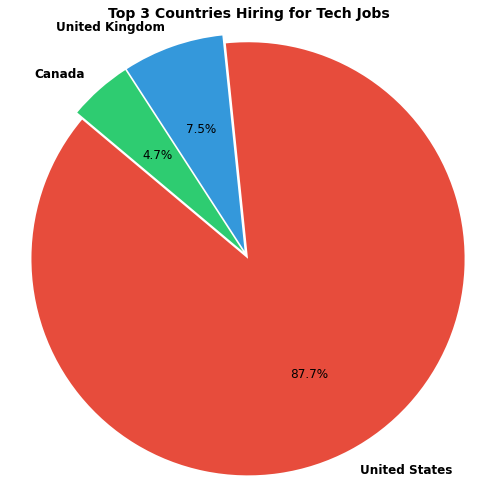

In [0]:
# Convert Spark DataFrame to Pandas
top_countries_pd = top_countries.toPandas()

# Extract values from DataFrame
labels = top_countries_pd["search_country"].tolist()
sizes = top_countries_pd["count"].tolist()

# Define bold, professional color palette
colors = ['#E74C3C', '#3498DB', '#2ECC71']  # red, blue, green
explode = [0.02] * len(labels)  # Slight separation for all slices

# Plot
plt.figure(figsize=(7, 7))
wedges, texts, autotexts = plt.pie(
    sizes,
    labels=labels,
    autopct='%1.1f%%',
    colors=colors,
    startangle=140,
    explode=explode,
    textprops=dict(color="black", fontsize=12)
)

# Title
plt.title("Top 3 Countries Hiring for Tech Jobs", fontsize=14, fontweight='bold')

# Make labels bold
for text in texts:
    text.set_fontweight('semibold')

plt.axis('equal')  # Equal aspect ratio ensures pie is a circle
plt.tight_layout()
plt.show()


#####📊 Interpretation: 
The donut chart and aggregated results highlight that:
- **United States** is the dominant contributor to tech job postings, accounting for approximately **87.7%** of the total.
- **United Kingdom** follows, contributing around **7.5%**.
- **Canada** contributes the remaining **4.7%**.

This trend indicates that the majority of tech job opportunities from this dataset are centered in the **U.S.**, making it the primary hub for tech hiring among the top countries analyzed. This distribution can help job seekers prioritize their location-based job search efforts.


###2. Top 20 cities in the United States offer the highest number of tech jobs

In [0]:
# Filter to show only job postings where the country is United States
us_tech_jobs_df = linkedin_tech_df.filter(lower(col("search_country")) == "united states")

# Display all job postings from the United States
display(us_tech_jobs_df)


job_link,last_processed_time,got_summary,got_ner,is_being_worked,job_title,company,job_location,first_seen,search_city,search_country,search_position,job_level,job_type,job_skills
https://www.linkedin.com/jobs/view/data-domain-architect-lead-workforce-planning-at-clickjobs-io-3800724481,2024-01-19 09:45:09.215838+00,t,t,f,"Data Domain Architect Lead, Workforce Planning",ClickJobs.io,"Townsend, DE",2024-01-12,Bridgeton,United States,Architect,Mid senior,Onsite,"Data Analytics, Report Automation, Visualization, Data Mining, Data Analysis, Tableau, SQL, Alteryx, Extract Transform Load (ETL), Critical Thinking, Problem Solving, Structured Query Language (SQL), Data Management, Data Governance, Big Data Platforms, Data Architecture, AWS, Snowflake, Microsoft Office (Excel PowerPoint), Python, PySpark, Power Business Intelligence (BI), Illustrator, Adobe Analytics, Research, Agile, Scrum, Bachelor’s Degree, Computer Science, Statistics, Engineering, Mathematics, Information Science, Verbal Communication, Written Communication, Analytical Skills, Large Scale Data Handling, Cloud Amazon Web Services (AWS / Azure)"
https://www.linkedin.com/jobs/view/software-engineer-at-community-behavioral-health-3799957973,2024-01-19 09:45:09.215838+00,t,t,f,Software Engineer,Community Behavioral Health,"Philadelphia, PA",2024-01-12,Winslow,United States,Agricultural-Research Engineer,Associate,Onsite,"SQL, Python, Django, HTML, CSS, JavaScript, Bootstrap, Microsoft Visual C# .net, Microsoft Visual Basic .net, VBScript, ETL, SSIS, DTS, Azure DevOps, Production Support, Healthcare, Teamwork, Collaboration, Respect, Member Centric, Honesty, Integrity, Commitment to Service Excellence, Compassion, Empathy, Problem Solving, Initiative, SelfDirected, Flexibility, Adaptability, Communication, Strategic Thinking, Leadership, Employee Development, Microsoft SQL Server 20002017, Pandas, XlsxWriter, Xlrd, Openpyxl, Pyodbc, SQLAlchemy, Internet Information Services (IIS)"
https://www.linkedin.com/jobs/view/staff-software-engineer-data-frameworks-at-ridgeline-3675316377,2024-01-19 09:45:09.215838+00,t,t,f,"Staff Software Engineer, Data Frameworks",Ridgeline,"Reno, NV",2024-01-12,Sparks,United States,Agricultural-Research Engineer,Mid senior,Onsite,"Data engineering, Software development lifecycle, AWS, Python, Java, Data structure, Algorithms, Architectural patterns, Relational databases, Backend infrastructure, React, Redux, Agile development, Design, Economics, Business, Problemsolving, Communication, Collaboration, Unit testing, Integration testing, Component testing, Workflows"
https://www.linkedin.com/jobs/view/senior-cloud-devsecops-engineer-at-applied-insight-llc-3762868844,2024-01-19 09:45:09.215838+00,t,t,f,Senior Cloud DevSecOps Engineer,"Applied Insight, LLC","Colorado Springs, CO",2024-01-12,Cripple Creek,United States,Architect,Mid senior,Onsite,"AWS, Azure, GCP, Terraform, Packer, Salt, Ansible, Python, Powershell, Bash, Javascript, Go, Helm, ArgoCD, Istio, Prometheus, SSO, MFA, SAML, iDP, RBAC, VDI, AWS Workspaces, Azure Windows Virtual Desktop, EFK Stacks, ElasticSearch, Fluentd, Kibana, Linux, Docker, Kubernetes, JSON, YAML, Infrastructure as Code, TCP/IP, Layer 3 Routing, BGP, Firewall Security, Cloud Experience, Linux configuration management, system administration, troubleshooting, CI/CD pipelines, Gitlab, Jenkins, Agile development methodologies, Zero Trust Architectures, CloudNative Architectures"
https://www.linkedin.com/jobs/view/senior-software-engineer-protocol-at-recruiting-from-scratch-3744392587,2024-01-19 09:45:09.215838+00,t,t,f,"Senior Software Engineer, Protocol",Recruiting from Scratch,"South Venice, FL",2024-01-12,Sarasota,United States,Agricultural-Research Engineer,Mid senior,Onsite,"Decentralized systems, Blockchain, Distributed key management, Multichain observer infrastructure, IBC protocol, Large scale simulation testing, Documentation, Ownership of various components, IBC toolchain roadmap, Sustainable growth, Scaling ad

In [0]:
# Step 1: Extract city from job_location (cleaned field)
us_tech_jobs_df = us_tech_jobs_df.withColumn("city", trim(split(col("job_location"), ",").getItem(0)))

# Step 2: Group by extracted city and count
top_us_cities = us_tech_jobs_df.groupBy("city") \
                               .count() \
                               .orderBy("count", ascending=False) \
                               .limit(20)

# Step 3: Display the result
display(top_us_cities)



city,count
New York,741
Chicago,492
Seattle,479
San Francisco,445
Atlanta,407
Austin,398
Boston,368
Washington,359
Dallas,348
Charlotte,265


Databricks visualization. Run in Databricks to view.

##### 📊 Interpretation:

- The chart above shows the **top 20 cities** ranked by job posting volume.
- Cities like **New York**, **Chicago**, **Seattle**, **San Francisco** and **Atlanta**  stand out with a significantly higher number of listings.
- Depspite being tech hub, **San franscisco** comes on a 4th position
- The red trend line represents the **average job posting count**, helping visualize how certain cities deviate above or below the average hiring volume.

This insight is particularly useful for job seekers deciding **where to relocate** or target their job search in the U.S. tech sector.


###3.  Top 15 Cities in California hiring for tech jobs

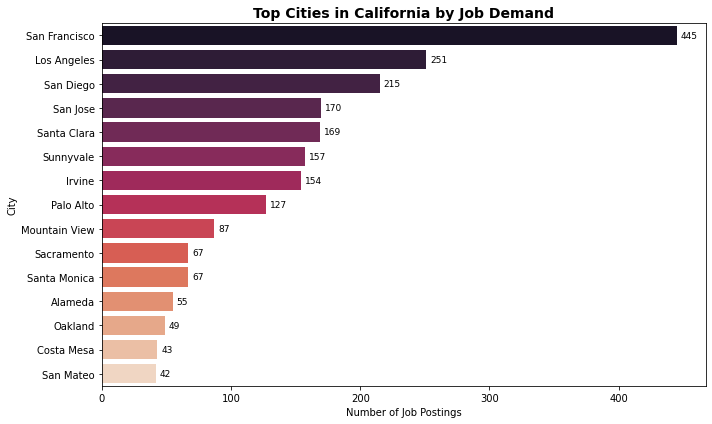

In [0]:
# Filter California jobs again if needed
ca_jobs_df = us_tech_jobs_df.filter(col("job_location").contains("CA"))

# Group and count jobs by city
top_cities = ca_jobs_df.groupBy("job_location").count().orderBy(col("count").desc()).limit(15)

# Convert to pandas for plotting
top_cities_pd = top_cities.toPandas()

# Remove ", CA" from labels
top_cities_pd["job_location"] = top_cities_pd["job_location"].str.replace(", CA", "", regex=False)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(
    y="job_location", 
    x="count", 
    data=top_cities_pd, 
    palette="rocket"
)

plt.title("Top Cities in California by Job Demand", fontsize=14, fontweight='bold')
plt.xlabel("Number of Job Postings")
plt.ylabel("City")
for index, value in enumerate(top_cities_pd["count"]):
    plt.text(value + 3, index, str(value), va="center", fontsize=9)

plt.tight_layout()
plt.show()


##### 📊 Interpretation:
This bar chart displays the distribution of tech job postings across various cities in California.

- **San Francisco** leads by a large margin, with over 400 postings, indicating its continued dominance as a tech hub.
- **Los Angeles**, **San Diego**, **San Jose**, and **Santa Clara** follow closely, confirming that tech opportunities are spread across both Northern and Southern California.
- Cities like **Mountain View**, **Sunnyvale**, and **Palo Alto** also reflect strong hiring activity, aligning with the presence of major tech companies in Silicon Valley.

📌 **Insight**: This analysis helps job seekers and researchers understand regional demand within California, highlighting the best cities for targeting tech job applications.


###4. Top Companies Hiring for tech jobs
Excluding Recruting firms in order to get accurate data on top companies hiring in tech roles

In [0]:
# Common recruiting agencies or job boards to exclude
consultancy_keywords = [
    "Recruiting", "Recruiter", "Search", "Hiring", "Staffing", "Consulting", 
    "Consultants", "Jobs", "Careers", "Dice", "ClickJobs", "ClearanceJobs", 
    "Talent", "Agency", "Placement", "Headhunting", "Hires", "From Scratch", "Humanity"
]

In [0]:
# Remove companies containing any of the keywords (case-insensitive)
pattern = "|".join([f"(?i){kw}" for kw in consultancy_keywords])
filtered_company_df = us_tech_jobs_df.filter(~col("company").rlike(pattern))


In [0]:
# Group and sort by count
top_filtered = filtered_company_df.groupBy("company").count().orderBy("count", ascending=False).limit(10)

# Convert to Pandas
top_filtered_pd = top_filtered.toPandas()


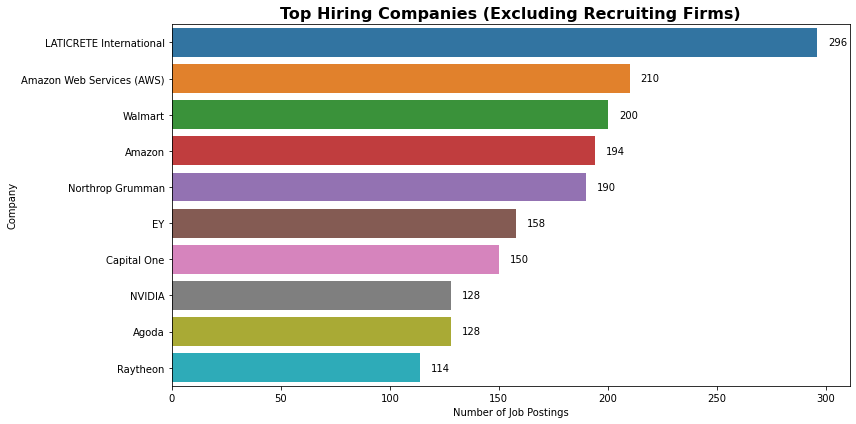

In [0]:
# Sort in ascending order for horizontal bar chart
top_direct_companies_pd = top_filtered_pd.sort_values("count", ascending=False)

# Set custom color palette based on company count
unique_colors = sns.color_palette("tab10", len(top_direct_companies_pd))  # or try "hls", "Set3" etc.

# Plot
plt.figure(figsize=(12, 6))
ax = sns.barplot(
    x="count",
    y="company",
    data=top_direct_companies_pd,
    palette=unique_colors
)

# Add count labels beside each bar
for i, (count, company) in enumerate(zip(top_direct_companies_pd["count"], top_direct_companies_pd["company"])):
    ax.text(count + 5, i, str(count), va="center", ha="left", fontsize=10)

# Titles and layout
plt.title("Top Hiring Companies (Excluding Recruiting Firms)", fontsize=16, weight="bold")
plt.xlabel("Number of Job Postings")
plt.ylabel("Company")
plt.tight_layout()

plt.show()


##### 📊 Interpretation:

This visualization highlights the top companies hiring for tech-related roles, excluding staffing and recruitment agencies.

- **LATICRETE International** surprisingly tops the list with nearly 300 postings, indicating a large hiring drive.
- Tech giants like **Amazon Web Services (AWS)**, **Amazon**, **NVIDIA**, and **Walmart** also show high demand, reinforcing their ongoing investments in technology and innovation.
- Consulting firms like **EY** and **Capital One**, along with defense and manufacturing companies such as **Raytheon** and **Northrop Grumman**, are also key players in tech hiring.

📌 **Insight**: The diverse range of top hiring companies—from cloud services to manufacturing—demonstrates the cross-industry demand for tech talent.


###5. Distribution of job types (Onsite, Remote, Hybrid) among US tech job postings

In [0]:
from pyspark.sql.functions import count
# Step 1: Job Type distribution (only for US Tech Jobs)
job_type_pattern = us_tech_jobs_df.groupBy("job_type") \
                                  .agg(count("*").alias("count")) \
                                  .orderBy(desc("count"))

display(job_type_pattern)


job_type,count
Onsite,26165
Remote,32
Hybrid,32


#####📊 Interpretation
- A **majority of job postings are Onsite** roles, indicating that many companies still prefer in-person work arrangements.
- **Remote and Hybrid roles are significantly less common**, each accounting for a very small fraction of the overall listings.

This could reflect either outdated job posting practices, organizational preferences, or a lack of updates to role classifications. Understanding this split helps job seekers tailor their expectations and preferences while applying.


###6. Distribution of job level for US tech job postings

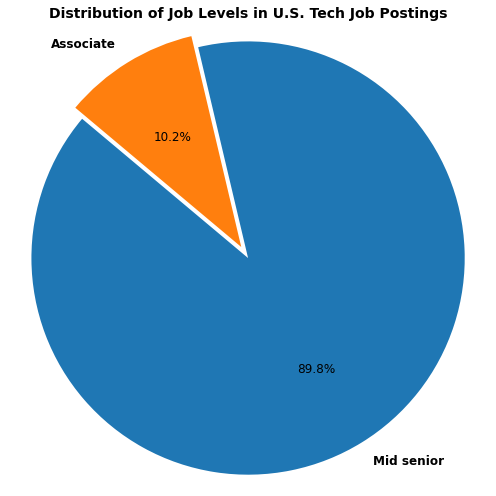

In [0]:
# Step 1: Group and count job levels
job_level_pattern = us_tech_jobs_df.groupBy("job_level") \
                                   .agg(count("*").alias("count")) \
                                   .orderBy(desc("count"))

# Step 2: Convert to Pandas
job_level_pd = job_level_pattern.toPandas()

# Step 3: Prepare chart data
labels = job_level_pd["job_level"].fillna("Unknown").tolist()
sizes = job_level_pd["count"].tolist()

# Define a bold, distinct color palette
colors = ['#1F77B4', '#FF7F0E', '#2CA02C', '#9467BD', '#D62728']  # Blue, Orange, Green, Purple, Red
explode = [0.03] * len(labels)  # Slight separation for all slices

# Step 4: Plot the pie chart
plt.figure(figsize=(7, 7))
wedges, texts, autotexts = plt.pie(
    sizes,
    labels=labels,
    autopct='%1.1f%%',
    colors=colors[:len(labels)],
    startangle=140,
    explode=explode,
    textprops={'fontsize': 12, 'color': 'black'}
)

# Title and formatting
plt.title("Distribution of Job Levels in U.S. Tech Job Postings", fontsize=14, fontweight='bold')
for text in texts:
    text.set_fontweight('semibold')

plt.axis('equal')  # Keep it circular
plt.tight_layout()
plt.show()


#####📊 Interpretation
- The vast majority of US tech jobs are at the **Mid-Senior** level, accounting for nearly **90%** of the listings.
- **Associate** roles make up a much smaller portion (~10%).

This skew suggests that employers are prioritizing experienced candidates, indicating a competitive market where prior expertise is highly valued.


###7. Top 10 Most In-Demand Tech Job Titles in the United States

#####**Predefined keyword mapping**
- Smart grouping to standardize the job title

In [0]:
# Predefined keyword mapping (smart grouping)
role_mapping = {
    # Software & Development
    "software": "Software Engineer",
    "developer": "Software Engineer",
    "development": "Software Engineer",
    "distinguished engineer": "Software Engineer",


    # Cloud & Infra
    "cloud": "Cloud Engineer",
    "aws": "Cloud Engineer",
    "azure": "Cloud Engineer",
    "data center": "Cloud Engineer",
    "datacenter": "Cloud Engineer",

    # Data Science
    "data scientist": "Data Scientist",
    "data science": "Data Scientist",
    "statistical modeling": "Data Scientist",
    "predictive modeling": "Data Scientist",
    "model risk": "Data Scientist",

    # Data Engineering
    "data engineer": "Data Engineer",
    "big data": "Data Engineer",        
    "bigdata": "Data Engineer",        
    "data quality": "Data Engineer",
    "data architect": "Data Engineer",
    "etl": "Data Engineer",
    "data warehouse": "Data Engineer",
    "data steward": "Data Engineer",
    "research analysis": "Data Engineer",
    "data modeling": "Data Engineer",
    "data systems engineer": "Data Engineer",
    "data operation": "Data Engineer",
    "engineering data infrastructure": "Data Engineer",
    "databricks": "Data Engineer",
    "data integration": "Data Engineer",
    "data lake": "Data Engineer",
    "data consultant": "Data Engineer",
     "data domain architect": "Data Engineer",

    # Analytics
    "data analyst": "Data Analyst",
    "analytics": "Data Analyst",
    "data analysis": "Data Analyst",
    "data reporting": "Data Analyst",
    "financial modeling": "Data Analyst",
    "data research" : "Data Analyst",
    "data risk analyst": "Data Analyst",
    "research data": "Data Analyst",
    "reporting analyst": "Data Analyst",
    "data integrity analyst": "Data Analyst",
    "data sr analyst": "Data Analyst",
    "data assurance": "Data Analyst",

    # Machine Learning & AI
    "machine learning": "Machine Learning Engineer",
    "deep learning": "Machine Learning Engineer",
    "mlops": "Machine Learning Engineer",
    "ai engineer": "AI Engineer",
    "artificial intelligence": "AI Engineer",
    "model validation": "Machine Learning Engineer",
    "ai modeling": "AI Engineer",
    "simulation": "AI Engineer",
    "data modeler": "Machine Learning Engineer",

    # Business Roles
    "business analyst": "Business Analyst",
    "business intelligence": "Business Intelligence Analyst",
    "bi developer": "Business Intelligence Analyst",

    # DevOps & Infra
    "devops": "DevOps Engineer",
    "platform engineer": "DevOps Engineer",
    "site reliability": "DevOps Engineer",

    # Database & Backend
    "database": "Database Engineer",

    # Architecture & Security
    "solution architect": "Solutions Architect",
    "data solutions architect": "Solutions Architect",
    "data loss prevention": "Cybersecurity Engineer",
    "dlp": "Cybersecurity Engineer",
    "data security": "Cybersecurity Engineer",

    # Data Management
    "data management": "Data Management Specialist",
    "master data": "Data Management Specialist",
    "metadata": "Data Management Specialist",
    "data governance": "Data Management Specialist",
    "data goernance": "Data Management Specialist",
    "data platforms administrator": "Data Management Specialist",

    # Known spelling corrections or variants
    "deeloper": "Software Engineer",  
    "analist": "Data Analyst",
    "enginerr": "Data Engineer",
    "architecht": "Solutions Architect",
    "devloper": "Software Engineer",
    "databriks": "Data Engineer"

}


#### Standardizing and Filtering Job Titles for Clean Tech Role Classification

To ensure clarity and consistency in analyzing job roles, this step standardizes job titles using a custom-defined UDF and removes noise or irrelevant listings. Here's what is performed:

- **Job Title Standardization**:
  - Lowercases all titles for uniformity,Removes titles with extra characters, Strips common seniority indicators.
  - Maps titles to a consistent, high-level role using a `role_mapping` dictionary.
- **Removal of Non-Tech or Misleading Roles**:
- **Noise Reduction**: Discards titles that appear fewer than 7 times, which are likely to be typos or one-off roles.

In [0]:
# Define the clean UDF
def map_role(title):
    if title is None:
        return None
    # Lowercase
    title = title.lower()
    # Remove unwanted characters: commas, hyphens, parentheses, slashes
    title = re.sub(r"[-,/()]", " ", title)
    # Remove unwanted words
    title = re.sub(r"(senior|sr\.|jr\.|lead|ii|iii|iv|v|principal|staff|entry level|associate|manager|intern)", "", title)
    # Replace multiple spaces with one
    title = re.sub(r"\s+", " ", title).strip()

    for keyword, role in role_mapping.items():
        if keyword in title:
            return role
    return title.title()

# Register UDF
map_role_udf = udf(map_role, StringType())

# Apply the UDF
us_tech_jobs_df = us_tech_jobs_df.withColumn("standard_job_title", map_role_udf(col("job_title")))


#------------------Filter out 'Non tech' jobs (before grouping)---------------------

# First: keep the exact "Data" match filter separate
us_tech_jobs_df = us_tech_jobs_df.filter(~col("standard_job_title").rlike("(?i)^data$"))

# Then: combine all other non-tech filters into one
us_tech_jobs_df = us_tech_jobs_df.filter(
    ~col("standard_job_title").rlike(
        "(?i)data entry|clinical data|audit|solutions consultant|mandataire immobilier h f|sales|"
        "data editor|data abstractor|attorney|counsel|legal|"
        "entry|editor|abstractor|coordinator|support|operator|assistant|intern|volunteer|"
        "records|compliance counsel|instructor|admin|clerk|secretary|reviewer|"
        "pracy|compliance|ethics"
    )
)


#-------------------Delete wrong/Irrelevant/Misspelled Job posting---------------------------------

# Step 1: Group to get count per job title
job_counts_df = us_tech_jobs_df.groupBy("standard_job_title").count()

# Step 2: Join the counts back to the main DataFrame
us_tech_jobs_df = us_tech_jobs_df.join(job_counts_df, on="standard_job_title", how="left")

# Step 3: Filter out rows with count < 7
us_tech_jobs_df = us_tech_jobs_df.filter(col("count") >= 7)

# Step 4: Drop the 'count' column if it's no longer needed
us_tech_jobs_df = us_tech_jobs_df.drop("count")



# Group and Display
grouped_job_titles = us_tech_jobs_df.groupBy("standard_job_title") \
                                    .count() \
                                    .orderBy("count", ascending=False)

display(grouped_job_titles.limit(10))

standard_job_title,count
Software Engineer,11704
Business Analyst,3572
Cloud Engineer,2470
Data Engineer,2077
Data Analyst,2012
Data Scientist,877
Machine Learning Engineer,685
Database Engineer,629
Business Intelligence Analyst,475
Data Management Specialist,313


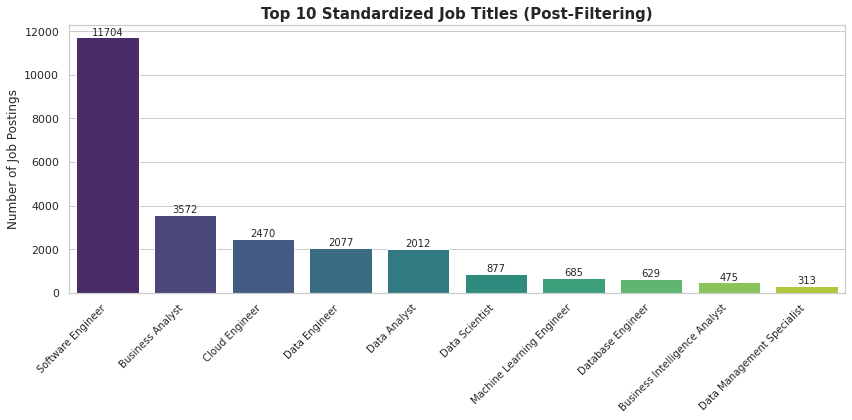

In [0]:
# Step 1: Convert grouped job title data to Pandas
grouped_titles_pd = grouped_job_titles.limit(10).toPandas().sort_values("count", ascending=False)


# Set visual style
sns.set(style="whitegrid")

# Create the plot
plt.figure(figsize=(12, 6))
ax = sns.barplot(x="standard_job_title", y="count", data=grouped_titles_pd, palette="viridis")

# Add value labels above bars
for i, val in enumerate(grouped_titles_pd["count"]):
    ax.text(i, val + 100, str(val), ha="center", fontsize=10)

# Customize title and labels
plt.title("Top 10 Standardized Job Titles (Post-Filtering)", fontsize=15, weight="bold")
plt.ylabel("Number of Job Postings")
plt.xlabel("")
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.tight_layout()
plt.show()


#####📊 Interpretation
This visualization presents the top 10 most in-demand tech job titles in the U.S. after standardizing the raw job titles and filtering out non-relevant entries such as internships, legal roles, and clerical positions. The `map_role` UDF was used to clean and unify various job title variations (e.g., "Sr. Data Engineer" → "Data Engineer").

###### 🔹 Key Insights:
- **Software Engineer** leads the chart with an overwhelming majority, reflecting its foundational demand in the tech industry.
- **Business Analyst**, **Cloud Engineer**, and **Data Engineer** follow as popular roles aligned with data-driven operations and cloud-based infrastructures.
- Specialized roles like **Data Scientist**, **Machine Learning Engineer**,and **BI Analyst**, also appear, indicating industry interest in advanced data skills.

This distribution helps identify core and emerging roles tech professionals can target in their job search or upskilling efforts.


### 8. Dominant skill clusters or themes across job postings (Using LDA Clustering)


To uncover patterns in job requirements, used **Latent Dirichlet Allocation (LDA)** clustering to group similar skills into dominant themes or clusters. This helps identify common tech stacks and in-demand skill groups.

- **Step 1**: Tokenize the `job_skills` field into an array of individual skills by splitting on commas and whitespace.
- **Step 2**: Handle missing skill entries by replacing null values with an empty array to maintain model stability.

 These preprocessing steps allows to convert unstructured job skill text into a structured format suitable for LDA topic modeling. The resulting clusters provide valuable insights into how tech companies bundle skill sets when hiring.

 
###### Tokenization:


In [0]:
from pyspark.sql.functions import array, when, col, split

# Step 1: Split job_skills into array of strings
tokenized_df = us_tech_jobs_df.withColumn("skills_array", split(col("job_skills"), ",\\s*"))

# Step 2 Fix nulls: replace any null skill arrays with an empty array
tokenized_df = tokenized_df.withColumn(
    "skills_array",
    when(col("skills_array").isNull(), array().cast("array<string>")).otherwise(col("skills_array"))
)

###### Remove Irrelevant Words (Stopwords)
To ensure cleaner and more meaningful skill clusters, used **StopWordsRemover** from PySpark. This removes generic or less informative words from the `skills_array`, such as:
- “and”, “or”, “with”, “for”, “a”, “an”, etc.

By filtering out these stopwords, the goal was to retain only the most relevant skills in the `filtered_skills` column, which improves the quality of topic modeling using LDA.


In [0]:
# Remove stopwords from the tokenized skill list
remover = StopWordsRemover(
    inputCol="skills_array",
    outputCol="filtered_skills"
)
filtered_df = remover.transform(tokenized_df)


###### Convert Skill Tokens into Feature Vectors

Used **CountVectorizer** to convert the cleaned `filtered_skills` array into a numerical feature vector called `features`.
- Each unique skill becomes a part of the vocabulary.
- The output `features` column contains a sparse vector representing the frequency of each skill per job posting.

This transformation is essential to feed data into the LDA model for clustering.


In [0]:

# Initialize CountVectorizer on the filtered skill tokens
vectorizer = CountVectorizer(inputCol="filtered_skills", outputCol="features")

# Fit the model to learn the vocabulary, then transform the data
cv_model = vectorizer.fit(filtered_df)
vectorized_df = cv_model.transform(filtered_df)


###### Topic Modeling Using LDA

Applied **Latent Dirichlet Allocation (LDA)** to uncover dominant **skill clusters or themes** across job postings.

- `k=8` topics are extracted from the `features` column (you may adjust `k` based on interpretability).
- Each topic represents a group of co-occurring skills, helped to identify common job role clusters in the tech industry.
- `describeTopics()` reveals the top skill indices for each cluster, which decoded in the next step.

This step is crucial for extracting meaningful patterns from unstructured job skill data.


In [0]:
# Initialize LDA with number of topics (k) and max iterations
lda = LDA(k=8, maxIter=10, featuresCol="features")  # You can adjust k as needed

# Fit the model on the vectorized skills data
lda_model = lda.fit(vectorized_df)

# Describe discovered topics (top skill indices per topic)
topics = lda_model.describeTopics()
topics.show(truncate=False)


+-----+-----------------------------------------------------+-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|topic|termIndices                                          |termWeights                                                                                                                                                                                                                        |
+-----+-----------------------------------------------------+-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|0    |[1, 0, 3, 67, 4, 42, 2, 6, 7, 5]                     |[3.082237227081749E-4, 2.2893354254725765E-4, 2.0799823425491512E-4, 

###### Interpreting LDA Topics Using Vocabulary

After training the LDA model, interpreted the resulting topics by:

- **Mapping the top term indices** from each topic to their corresponding skill words using the learned vocabulary from CountVectorizer.
- **Displaying the top keywords per topic**, which helped to understand the **dominant skill clusters**.

These clusters provide insights into the types of roles or areas (e.g., data engineering, cloud, machine learning) most commonly grouped together in the job market.


In [0]:
# Step 1: Describe topic indices
topics = lda_model.describeTopics()

# Step 2: Map indices to words
vocab = cv_model.vocabulary
topics_words = topics.rdd.map(lambda row: [vocab[i] for i in row['termIndices']]).collect()

# Step 3: Display skill clusters for interpretation
for i, topic in enumerate(topics_words):
    print(f"\n🔹 Topic {i}: {', '.join(topic)}")



🔹 Topic 0: SQL, Python, AWS, Project management, Communication, Communication skills, Java, Kubernetes, Software Engineering, Agile

🔹 Topic 1: Python, Java, C++, Linux, Switching, Routing, Software Engineering, Traceroute, CURL, LAN/WAN

🔹 Topic 2: Python, SQL, AWS, Java, JavaScript, Kubernetes, React, Communication, Agile, Machine learning

🔹 Topic 3: Python, Communication, SQL, C++, Java, CCSP, CISSP, CISA, Security+, GIAC

🔹 Topic 4: Communication, SQL, Testing, Python, Software Engineering, Software Development, Teamwork, AWS, Data Analysis, Computer Science

🔹 Topic 5: Python, Oracle Certifications, Oracle Cloud Supply Chain Collaboration, Oracle Cloud Demand Management, SQL, Oracle Cloud Sales & Operations, Work in Progress, Supply & Demand Planning, Shop Floor Manager, Bills of Material

🔹 Topic 6: Python, SQL, Java, AWS, Communication, Agile, Kubernetes, Software Engineering, Data Analysis, Docker

🔹 Topic 7: VLookups, SQL, Python, Docker, Java, Integration testing, Kubernete

In [0]:
topics_words = [
    ['SQL', 'Communication', 'Data analysis', 'Integration testing', 'VLookups', 'Python', 'AWS', 'Design skills', 'Unit testing', 'E1 Batch application'],
    ['Python', 'Java', 'Software Engineering', 'RDFS', 'SKOS', 'SQL', 'OWL', 'Data.World', 'SHACL', 'SPARQL'],
    ['React', 'AWS', 'Python', 'Kubernetes', 'Docker', 'Java', 'SQL', 'JavaScript', 'Software Engineering', 'Angular'],
    ['Python', 'Software development', 'Communication', 'SQL', 'Machine learning', 'Blockchain', 'C++', 'Data analysis', 'Communication skills', 'Computer science'],
    ['Communication', 'SQL', 'Testing', 'Python', 'Software Development', 'Computer Science', 'Troubleshooting','Warehouse Management', 'Oracle Certifications', 'Teamwork'],
    ['Python', 'Java', 'Communication', 'Business Analysis', 'C++', 'Linux', 'SQL', 'Problem Solving', 'Teamwork', 'Software Development'],
    [ 'Python', 'SQL', 'Java', 'AWS', 'Communication', 'Agile', 'Data Analysis', 'Software Engineering', 'Kubernetes', 'Docker'],
    ['Java', 'Python', 'SQL', 'Docker', 'Agile practices', 'AWS, Kubernetes', 'NoSQL databases', 'Open Source RDBMS', 'Cloud computing']
]


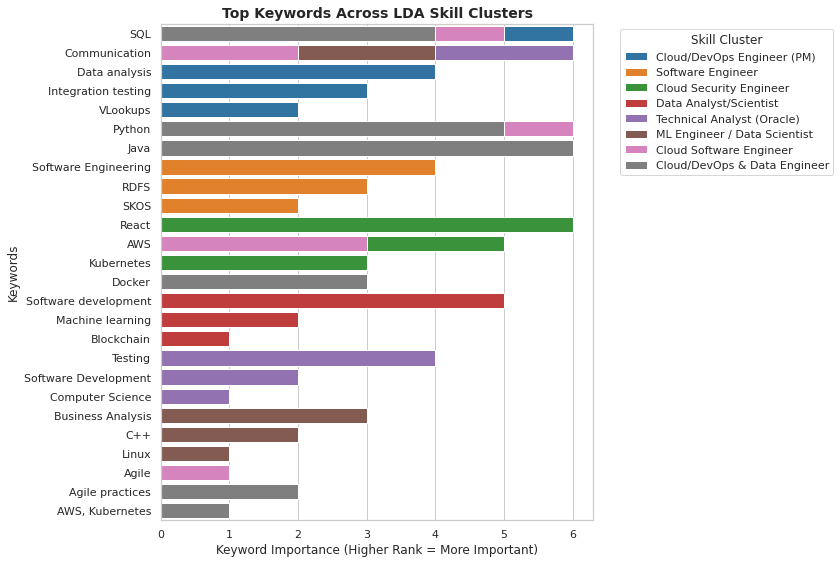

In [0]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define topic labels
topic_labels = {
    0: "Cloud/DevOps Engineer (PM)",
    1: "Software Engineer",
    2: "Cloud Security Engineer",
    3: "Data Analyst/Scientist",
    4: "Technical Analyst (Oracle)",
    5: "ML Engineer / Data Scientist",
    6: "Cloud Software Engineer",
    7: "Cloud/DevOps & Data Engineer"
}

# Flatten topics into a DataFrame
data = []
for i, keywords in enumerate(topics_words):
    for rank, keyword in enumerate(keywords[:6]):  # Top 6 only for readability
        data.append({"Topic": f"Topic {i}", "Label": topic_labels[i], "Keyword": keyword, "Rank": 6 - rank})

df = pd.DataFrame(data)

# Plot
plt.figure(figsize=(12, 8))
sns.barplot(data=df, x="Rank", y="Keyword", hue="Label", dodge=False, palette="tab10")

plt.title("Top Keywords Across LDA Skill Clusters", fontsize=14, fontweight='bold')
plt.xlabel("Keyword Importance (Higher Rank = More Important)")
plt.ylabel("Keywords")
plt.legend(title="Skill Cluster", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


######Assigning Dominant Topic to Each Job Posting

After training the LDA model on the vectorized skill features, this step assigns a **dominant topic number** to each job posting based on the highest probability in its topic distribution.
- `lda_model.transform(...)`: Adds a `topicDistribution` column for each posting.
- `get_dominant_topic(...)`: A custom UDF that extracts the index of the topic with the highest weight.
- `withColumn("dominant_topic", ...)`: Appends the most likely topic (0–7) for each row in the dataset.

This allowed to group or analyze job postings based on their **predominant skill theme**.


In [0]:
lda_output = lda_model.transform(vectorized_df)

def get_dominant_topic(topic_distribution):
    return int(topic_distribution.toArray().tolist().index(max(topic_distribution)))

get_topic_udf = udf(get_dominant_topic, IntegerType())
final_df = lda_output.withColumn("dominant_topic", get_topic_udf(col("topicDistribution")))

######Mapping LDA Topics to Skill Cluster Labels

To make the LDA topic outputs interpretable, this section maps each numeric topic (`0–7`) to a **descriptive skill cluster label**. These labels are based on the dominant skill themes observed within each topic group.

- A Python dictionary is used to associate topic indices with meaningful names like `"AI-Driven Software Engineering"` or `"Cloud DevOps, Platform & Security Engineering"`.
- Used `create_map()` and `withColumn()` to apply this mapping to all rows.
- The resulting `topic_label` column gives an easy way to analyze or filter job postings based on their dominant skill cluster.

This step transforms raw clustering output into clear **semantic groupings** for downstream analysis and visualization.


In [0]:
# Correct topic-label mapping

topic_labels = {
    0: "Cloud/DevOps Engineer with Project Management",
    1: "Software Engineer",
    2: "Cloud Security Engineer/Analyst",
    3: "Data Analyst/Scientist with Leadership",
    4: "Technical Analyst/Lead (potentially Oracle/Supply Chain)",
    5: "Machine Learning Engineer/Data Scientist",
    6: "Cloud Software Engineer with Data Skills",
    7: "Cloud/DevOps & Data Engineer"
}



# Create mapping expression for Spark
label_map_expr = create_map([lit(x) for pair in topic_labels.items() for x in pair])

# Add new column to DataFrame
final_df = final_df.withColumn("topic_label", label_map_expr[col("dominant_topic")])

# Display sample for validation
display(
    final_df.select(
        "job_title",
        "standard_job_title",
        "company",
        "job_location",
        "job_level",
        "job_skills",
        "dominant_topic",
        "topic_label"
    )
)

job_title,standard_job_title,company,job_location,job_level,job_skills,dominant_topic,topic_label
"Data Domain Architect Lead, Workforce Planning",Data Engineer,ClickJobs.io,"Townsend, DE",Mid senior,"Data Analytics, Report Automation, Visualization, Data Mining, Data Analysis, Tableau, SQL, Alteryx, Extract Transform Load (ETL), Critical Thinking, Problem Solving, Structured Query Language (SQL), Data Management, Data Governance, Big Data Platforms, Data Architecture, AWS, Snowflake, Microsoft Office (Excel PowerPoint), Python, PySpark, Power Business Intelligence (BI), Illustrator, Adobe Analytics, Research, Agile, Scrum, Bachelor’s Degree, Computer Science, Statistics, Engineering, Mathematics, Information Science, Verbal Communication, Written Communication, Analytical Skills, Large Scale Data Handling, Cloud Amazon Web Services (AWS / Azure)",6,Cloud Software Engineer with Data Skills
Software Engineer,Software Engineer,Community Behavioral Health,"Philadelphia, PA",Associate,"SQL, Python, Django, HTML, CSS, JavaScript, Bootstrap, Microsoft Visual C# .net, Microsoft Visual Basic .net, VBScript, ETL, SSIS, DTS, Azure DevOps, Production Support, Healthcare, Teamwork, Collaboration, Respect, Member Centric, Honesty, Integrity, Commitment to Service Excellence, Compassion, Empathy, Problem Solving, Initiative, SelfDirected, Flexibility, Adaptability, Communication, Strategic Thinking, Leadership, Employee Development, Microsoft SQL Server 20002017, Pandas, XlsxWriter, Xlrd, Openpyxl, Pyodbc, SQLAlchemy, Internet Information Services (IIS)",6,Cloud Software Engineer with Data Skills
"Staff Software Engineer, Data Frameworks",Software Engineer,Ridgeline,"Reno, NV",Mid senior,"Data engineering, Software development lifecycle, AWS, Python, Java, Data structure, Algorithms, Architectural patterns, Relational databases, Backend infrastructure, React, Redux, Agile development, Design, Economics, Business, Problemsolving, Communication, Collaboration, Unit testing, Integration testing, Component testing, Workflows",6,Cloud Software Engineer with Data Skills
Senior Cloud DevSecOps Engineer,Cloud Engineer,"Applied Insight, LLC","Colorado Springs, CO",Mid senior,"AWS, Azure, GCP, Terraform, Packer, Salt, Ansible, Python, Powershell, Bash, Javascript, Go, Helm, ArgoCD, Istio, Prometheus, SSO, MFA, SAML, iDP, RBAC, VDI, AWS Workspaces, Azure Windows Virtual Desktop, EFK Stacks, ElasticSearch, Fluentd, Kibana, Linux, Docker, Kubernetes, JSON, YAML, Infrastructure as Code, TCP/IP, Layer 3 Routing, BGP, Firewall Security, Cloud Experience, Linux configuration management, system administration, troubleshooting, CI/CD pipelines, Gitlab, Jenkins, Agile development methodologies, Zero Trust Architectures, CloudNative Architectures",6,Cloud Software Engineer with Data Skills
"Senior Software Engineer, Protocol",Software Engineer,Recruiting from Scratch,"South Venice, FL",Mid senior,"Decentralized systems, Blockchain, Distributed key management, Multichain observer infrastructure, IBC protocol, Large scale simulation testing, Documentation, Ownership of various components, IBC toolchain roadmap, Sustainable growth, Scaling adoption, Medical, Dental, Vision",3,Data Analyst/Scientist with Leadership
Software Engineer - Full Stack,Software Engineer,Mujin US,"Suwanee, GA",Associate,"React, Babylon.js, WebGL, Qt/QML, TypeScript, JavaScript, Linear algebra, Computer graphics, Desktop UI frameworks, Mobile UI frameworks, Web UI frameworks, Linux, Warehouse management tools (WMS), Python, C++, Asynchronous programming, Threading, Localization pipeline, C++ addon development",6,Cloud Software Engineer with Data Skills
Google Cloud Platform Developer,Cloud Engineer,Experfy,"Austin, TX",Mid senior,"AngularJS, Qlik Sense, SSIS, SQL, Java, Cloud computing, StackOverflow, APIs, SDKs, Client libraries",6,Cloud Software Engineer with Data Skills
Cloud Infrastructure Architect,Cloud Engineer,Amtex Systems Inc.,"Sacramento, CA",Mid senior,"Cloud Consulting, Azure a

###9. Which California City is hiring for which roles?

In [0]:
from pyspark.sql.functions import col, regexp_replace

# Use latest cleaned DF with 'standard_job_title'
ca_jobs_df = us_tech_jobs_df.filter(col("job_location").contains("CA"))
ca_jobs_df = ca_jobs_df.withColumn("clean_city", regexp_replace(col("job_location"), ", CA", ""))

# Get top 5 cities
top_cities_df = ca_jobs_df.groupBy("clean_city").count().orderBy(col("count").desc())
top_cities_pd = top_cities_df.limit(10).toPandas()
top5_cities = top_cities_pd["clean_city"].head(5).tolist()

# Filter jobs for those top cities
top5_jobs_df = ca_jobs_df.filter(col("clean_city").isin(top5_cities))

# Group by city and standardized job title
top5_titles = top5_jobs_df.groupBy("clean_city", "standard_job_title") \
                          .count().orderBy("clean_city", "count", ascending=False)

display(top5_titles)


clean_city,standard_job_title,count
Santa Clara,Software Engineer,94
Santa Clara,Cloud Engineer,35
Santa Clara,Machine Learning Engineer,21
Santa Clara,Data Scientist,5
Santa Clara,Data Engineer,3
Santa Clara,Business Analyst,3
Santa Clara,Data Management Specialist,2
Santa Clara,AI Engineer,2
Santa Clara,Data Analyst,2
Santa Clara,Business Intelligence Analyst,1


Databricks visualization. Run in Databricks to view.

## D. JOB RECOMMENDATION SYSTEM
####(content-based filtering model)

#### Step 1: Create a Combined Text Column for Vectorization
In this step, generated a composite textual representation for each job posting by merging multiple descriptive fields. This is crucial for transforming structured job data into a form suitable for Natural Language Processing (NLP) techniques.

Used `concat_ws` to combine:**Standardized Job Title**, **Job Level**, **Topic Cluster Label** (from LDA modeling)
, and **Job Skills**

The resulting column `job_text` will encapsulate the complete contextual identity of each job and will be vectorized in subsequent steps to enable similarity-based recommendations.


In [0]:


# Combine relevant columns into one 'job_text' column
job_text_df = final_df.withColumn(
    "job_text",
    concat_ws(" ", 
              col("standard_job_title"), 
              col("job_level"), 
              col("topic_label"),
              col("job_skills"))
)

#### Step 2: Transform Job Text into TF-IDF Vectors

To build a content-based recommendation system, needed to numerically represent each job posting. Used **TF-IDF (Term Frequency–Inverse Document Frequency)**, a common technique in NLP that quantifies how important a word is in a document relative to a corpus.

Here's the process:

1. **Tokenization**: Split the `job_text` into individual words.
2. **Stopword Removal**: Eliminate common, uninformative words (e.g., "and", "the", "with").
3. **HashingTF**: Apply the hashing trick to map words to feature indices (a space-efficient method).
4. **IDF Transformation**: Weight the hashed term frequencies by inverse document frequency, boosting rare but meaningful terms.

The result is a new column `tfidf_features` containing vectorized representations of job descriptions, which will be used for computing similarity between jobs.

In [0]:
# Tokenize job_text
tokenizer = Tokenizer(inputCol="job_text", outputCol="words")
words_df = tokenizer.transform(job_text_df)

# Remove stopwords
remover = StopWordsRemover(inputCol="words", outputCol="filtered_words")
filtered_df = remover.transform(words_df)

# HashingTF
hashingTF = HashingTF(inputCol="filtered_words", outputCol="raw_tfidf_features", numFeatures=10000)
featurized_data = hashingTF.transform(filtered_df)

# IDF
idf = IDF(inputCol="raw_tfidf_features", outputCol="tfidf_features")
idf_model = idf.fit(featurized_data)
tfidf_df = idf_model.transform(featurized_data)

#### Step 3: Job Recommendation Function (Content-Based Filtering)

Defined a **custom recommendation function** that suggests the most relevant job postings based on user input using **TF-IDF similarity**.

##### How It Works:
1. **Input**: User specifies a few keywords describing their target role (e.g., "cloud devops aws").
2. **Tokenization & Stopword Removal**: Clean and filter the user query to retain meaningful words.
3. **TF-IDF Vectorization**: Convert the processed query into a TF-IDF vector using the same pipeline used for job postings.
4. **Cosine Similarity**: Calculate similarity between the user vector and every job posting in the dataset.
5. **Filtering (Optional)**: User can optionally filter results by location, job level, or job type.
6. **Ranking**: Jobs are sorted by similarity, and the top N matches are returned.

This function enables **personalized job recommendations** based on content similarity between user preferences and job posting attributes.

In [0]:

def recommend_jobs(user_text, location=None, job_level=None, job_type=None, top_n=10):
    # Clean and tokenize user input
    user_words = user_text.lower().split()
    remover = StopWordsRemover()
    user_filtered = [word for word in user_words if word not in remover.getStopWords()]
    user_df = spark.createDataFrame([(user_filtered,)], ["filtered_words"])

    # TF-IDF transform using trained models
    user_tf = hashingTF.transform(user_df)
    user_tfidf = idf_model.transform(user_tf).select("tfidf_features").first()["tfidf_features"]

    # Cosine similarity function
    def cosine_similarity(vec1, vec2):
        arr1 = vec1.toArray()
        arr2 = vec2.toArray()
        norm1 = np.linalg.norm(arr1)
        norm2 = np.linalg.norm(arr2)
        if norm1 == 0 or norm2 == 0:
            return 0.0
        return float(np.dot(arr1, arr2) / (norm1 * norm2))

    cosine_udf = udf(lambda x: cosine_similarity(user_tfidf, x), DoubleType())

    # Apply similarity score
    scored_df = tfidf_df.withColumn("similarity", cosine_udf(col("tfidf_features")))

    # Optional filters
    if location:
        scored_df = scored_df.filter(col("job_location").contains(location))
    if job_level:
        scored_df = scored_df.filter(col("job_level") == job_level)
    if job_type:
        scored_df = scored_df.filter(col("job_type") == job_type)

    # Return top matches
    return scored_df.select("job_title", "company", "job_location", "job_level", "job_type", "similarity") \
                    .orderBy(col("similarity").desc()) \
                    .limit(top_n)


#### Step 4: Input the values to get the recommendation

In this example, simulated a user looking for roles related to **data science**, specifically mentioning skills like **Python** and **machine learning**.

**Filters applied:**
- 📍 Location: *Los Angeles*
- 🎯 Job Level: *Mid senior*
- 🔢 Top 20 most relevant postings (based on content similarity)

This query helps surface roles that closely match the user's intent, combining job title, skills, and topic themes using the **TF-IDF similarity-based recommender**.

In [0]:
display(recommend_jobs(
    user_text="data science with python, machine learning",
    location="Los Angeles",
    job_level="Mid senior",
    #job_type="",
    top_n=20
))

job_title,company,job_location,job_level,job_type,similarity
Machine Learning Engineer,Tencent Games,"Los Angeles, CA",Mid senior,Onsite,0.22397770922987767
Senior Machine Learning Engineer (Computer Vision Recognition),"Verticalmove, Inc","Los Angeles, CA",Mid senior,Onsite,0.2229459514268611
"Principal Machine Learning Engineer, ML Training Platform",Snap Inc.,"Los Angeles, CA",Mid senior,Onsite,0.17993408866220822
Junior Data Engineer,"GGG Demolition, Inc.","Los Angeles, CA",Mid senior,Onsite,0.1770205446695251
"Staff Machine Learning Engineer, Series A",Recruiting from Scratch,"Los Angeles, CA",Mid senior,Onsite,0.16274071149625846
"Machine Learning Engineer, Generative ML , 3+ Years of Experience",Snap Inc.,"Los Angeles, CA",Mid senior,Onsite,0.14584043816221195
TS/SCI Data Scientist,Harnham,"Los Angeles, CA",Mid senior,Onsite,0.1361347800790563
"Staff Machine Learning Engineer, Series A",Recruiting from Scratch,"Los Angeles, CA",Mid senior,Onsite,0.13002194264488234
(Global Oil Gas) Senior Data Scientist Expert,MatchaTalent,"Los Angeles, CA",Mid senior,Onsite,0.10120359028406348
Senior Machine Learning Engineer,Freeform,"Los Angeles, CA",Mid senior,Onsite,0.09915128236529347


In [0]:
# With this registered as a temp view, it will only be available to this particular notebook. If you'd like other users to be able to query this table, you can also create a table from the DataFrame.
# Once saved, this table will persist across cluster restarts as well as allow various users across different notebooks to query this data.
# To do so, choose your table name and uncomment the bottom line.

permanent_table_name = "linkedin_job_postings_csv"

# df.write.format("parquet").saveAsTable(permanent_table_name)